# Models pipeline test
Este notebook presenta un pipeline para evaluar el rendimiento de diferentes modelos

In [116]:
import pandas as pd
from sklearn.model_selection import train_test_split
from skopt.space import Real, Integer, Categorical
from skopt import BayesSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [117]:
dataset = pd.read_excel('data_pattern_5_inclusive.xlsx')

## Protocol
---

In [118]:
X = dataset.filter(like='feature_').values
y = dataset['class'].values
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Machine learning

## Search Spaces

In [119]:
# Define hyperparameter search spaces
from skopt.space import Real, Integer
search_spaces = {
    "Random_Forest": {
		"n_estimators": Integer(50, 300),
		"max_depth": Integer(5, 50)
	},
    "SVM": {
		"C": Real(0.1, 10),
		"gamma": Real(0.01, 1)
	},
    'xgb': {
		"n_estimators": Integer(50, 300),  # Number of trees
		"max_depth": Integer(3, 10),       # Tree depth
		"learning_rate": Real(0.01, 0.3, prior="log-uniform"),  # Step size shrinkage
		"subsample": Real(0.5, 1.0),       # Sampling ratio
		"colsample_bytree": Real(0.5, 1.0) # Feature sampling ratio
	},
    'knn': {
		"n_neighbors": Integer(1, 30),          # Number of neighbors
		"weights": Categorical(["uniform", "distance"]),  # Weight function
		"metric": Categorical(["minkowski", "manhattan", "euclidean"])  # Distance metric
	}
}


## Random forest

In [68]:
rf_model = RandomForestClassifier(random_state=42)

In [69]:
opt_rf = BayesSearchCV(
    rf_model,
    search_spaces['Random_Forest'],
    n_iter=20,  # Number of parameter evaluations
    cv=5,       # Cross-validation folds
    scoring='accuracy',
    random_state=42
)

opt_rf.fit(X_train, y_train)
# Best parameters and score
print("Best parameters for Random Forest:", opt_rf.best_params_)
print("Best cross-validation accuracy:", opt_rf.best_score_)

Best parameters for Random Forest: OrderedDict([('max_depth', 22), ('n_estimators', 300)])
Best cross-validation accuracy: 0.643295698682309


Best parameters for Random Forest: OrderedDict([('max_depth', 38), ('n_estimators', 285)])
Best cross-validation accuracy: 0.6239974739501105


In [70]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Reinitialize the Random Forest model with best parameters
best_rf = RandomForestClassifier(
    max_depth=22,
    n_estimators=300,
    random_state=42
)

# Train the model on the training set
best_rf.fit(X_train, y_train)


RandomForestClassifier(max_depth=22, n_estimators=300, random_state=42)

In [71]:
# Predict on the test set
y_pred_rf = best_rf.predict(X_test)

# Calculate accuracy
test_accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Random Forest Test Accuracy: {test_accuracy_rf}")

# Generate a classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf))

# Confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))


Random Forest Test Accuracy: 0.6569500674763833

Classification Report:
               precision    recall  f1-score   support

     afrobeat       0.96      0.27      0.42       189
    afrocuban       0.96      0.58      0.72       151
        blues       0.00      0.00      0.00        16
      country       0.00      0.00      0.00        23
        dance       0.91      0.29      0.44       106
         funk       0.80      0.59      0.68       438
       gospel       0.50      0.15      0.24        13
     highlife       0.00      0.00      0.00        27
       hiphop       1.00      0.35      0.52       144
         jazz       0.84      0.53      0.65       419
        latin       0.62      0.89      0.73       685
middleeastern       1.00      0.48      0.65        23
   neworleans       0.83      0.33      0.47       138
          pop       1.00      0.16      0.27        44
         punk       0.88      0.27      0.42        51
       reggae       1.00      0.43      0.60   

/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

## SVM

In [54]:
svm_model = SVC(kernel="rbf", random_state=42)
opt_svm = BayesSearchCV(
    svm_model,
    search_spaces['SVM'],
    n_iter=20,
    cv=5,
    scoring='accuracy',
    random_state=42
)

opt_svm.fit(X_train, y_train)

# Best parameters and score
print("Best parameters for SVM:", opt_svm.best_params_)
print("Best cross-validation accuracy:", opt_svm.best_score_)

Best parameters for SVM: OrderedDict([('C', 5.047419771987393), ('gamma', 0.6089202466329952)])
Best cross-validation accuracy: 0.6802874936440293


Best parameters for SVM: OrderedDict([('C', 3.7518321939109605), ('gamma', 0.9995336846210754)])
Best cross-validation accuracy: 0.6003157562361856


In [55]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Reinitialize the SVM model with best parameters
best_svm = SVC(
    kernel="rbf",
    C=5.047419771987393,
    gamma=0.6089202466329952,
    random_state=42
)

# Train the model on the training set
best_svm.fit(X_train, y_train)


SVC(C=5.047419771987393, gamma=0.6089202466329952, random_state=42)

In [56]:
# Predict on the test set
y_pred_svm = best_svm.predict(X_test)

# Calculate accuracy
test_accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"SVM Test Accuracy: {test_accuracy_svm}")

# Generate a classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_svm))

# Confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_svm))


SVM Test Accuracy: 0.6958882854926299

Classification Report:
               precision    recall  f1-score   support

     afrobeat       0.68      0.56      0.61       194
    afrocuban       0.84      0.63      0.72       154
        blues       0.67      0.24      0.35        17
      country       0.54      0.29      0.38        24
        dance       0.72      0.59      0.65       108
         funk       0.69      0.72      0.71       456
       gospel       0.43      0.23      0.30        13
     highlife       0.73      0.29      0.41        28
       hiphop       0.89      0.59      0.71       157
         jazz       0.68      0.58      0.63       437
        latin       0.72      0.82      0.77       704
middleeastern       1.00      0.87      0.93        23
   neworleans       0.72      0.57      0.64       143
          pop       0.86      0.49      0.62        49
         punk       0.70      0.35      0.47        54
       reggae       0.89      0.71      0.79        55
  

## XGBooost

In [120]:
from sklearn.preprocessing import LabelEncoder

# Initialize the encoder
label_encoder = LabelEncoder()

# Encode the class labels
y_encoded = label_encoder.fit_transform(y)

# Now split the dataset with the encoded labels
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)


In [85]:
from xgboost import XGBClassifier
from skopt import BayesSearchCV

# Initialize the model
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss")

# Perform Bayesian Optimization
opt_xgb = BayesSearchCV(
    xgb_model,
    search_spaces['xgb'],
    n_iter=20,  # Number of iterations to explore the parameter space
    cv=5,       # 5-fold cross-validation
    scoring="f1_weighted",
    random_state=42
)

# Fit on the training data
opt_xgb.fit(X_train, y_train)

# Output the best parameters and performance
print("Best parameters for XGBoost:", opt_xgb.best_params_)
print("Best cross-validation accuracy for XGBoost:", opt_xgb.best_score_)


/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [19:46:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [19:46:15] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [19:46:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [19:46:39] WARNING: /Users/runner/work/xgboost/xgb

Best parameters for XGBoost: OrderedDict([('colsample_bytree', 0.9186941777766422), ('learning_rate', 0.2017268796559709), ('max_depth', 5), ('n_estimators', 288), ('subsample', 0.9320639577324754)])
Best cross-validation accuracy for XGBoost: 0.7553304857107643


Best parameters for XGBoost: OrderedDict([('colsample_bytree', 1.0), ('learning_rate', 0.29999999999999993), ('max_depth', 8), ('n_estimators', 300), ('subsample', 1.0)])

In [84]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize the model with the best parameters
best_xgb = XGBClassifier(
    colsample_bytree=0.9186941777766422,
    learning_rate=0.2017268796559709,  # Rounded to the nearest reasonable precision
    max_depth=5,
    n_estimators=288,
    subsample=0.9320639577324754,
    random_state=42,
    use_label_encoder=False,
    eval_metric="logloss"
)

# Fit the model on the training data
best_xgb.fit(X_train, y_train)

# Predict on the test set
y_pred = best_xgb.predict(X_test)


/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning: [19:44:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [83]:
# Decode predictions if using label encoding
y_pred_decoded = label_encoder.inverse_transform(y_pred)
y_test_decoded = label_encoder.inverse_transform(y_test)

# Calculate accuracy
test_accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Test Accuracy: {test_accuracy}")

# Detailed classification report
print("\nClassification Report:")
print(classification_report(y_test_decoded, y_pred_decoded))

# Confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test_decoded, y_pred_decoded))


Test Accuracy: 0.7708502024291498

Classification Report:
               precision    recall  f1-score   support

     afrobeat       0.90      0.62      0.73       189
    afrocuban       0.86      0.77      0.82       151
        blues       0.88      0.44      0.58        16
      country       0.78      0.30      0.44        23
        dance       0.84      0.55      0.66       106
         funk       0.81      0.78      0.79       438
       gospel       0.56      0.38      0.45        13
     highlife       1.00      0.19      0.31        27
       hiphop       0.97      0.61      0.75       144
         jazz       0.84      0.69      0.76       419
        latin       0.76      0.91      0.83       685
middleeastern       1.00      0.83      0.90        23
   neworleans       0.82      0.61      0.70       138
          pop       0.72      0.41      0.52        44
         punk       0.84      0.51      0.63        51
       reggae       0.97      0.61      0.75        54
      

Test Accuracy: 0.6665824703207881

## lightgbm

In [30]:
from skopt.space import Integer, Real

# Define the search space
search_space_lgb = {
    "num_leaves": Integer(20, 100),          # Number of leaves in each tree
    "max_depth": Integer(3, 10),            # Maximum depth of the trees
    "learning_rate": Real(0.01, 0.3, prior="log-uniform"),  # Step size
    "n_estimators": Integer(50, 300),       # Number of boosting iterations
    "subsample": Real(0.5, 1.0),            # Fraction of data to sample per tree
    "colsample_bytree": Real(0.5, 1.0)      # Fraction of features to sample per tree
}


In [31]:
from lightgbm import LGBMClassifier
from skopt import BayesSearchCV

# Initialize the LightGBM model
lgb_model = LGBMClassifier(random_state=42)

# Perform Bayesian Optimization
opt_lgb = BayesSearchCV(
    lgb_model,
    search_space_lgb,
    n_iter=20,  # Number of iterations
    cv=5,       # 5-fold cross-validation
    scoring="accuracy",
    random_state=42
)

# Fit the model on the training data
opt_lgb.fit(X_train, y_train)

# Output the best parameters and performance
print("Best parameters for LightGBM:", opt_lgb.best_params_)
print("Best cross-validation accuracy for LightGBM:", opt_lgb.best_score_)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 12668, number of used features: 16
[LightGBM] [Info] Start training from score -3.002703
[LightGBM] [Info] Start training from score -3.242277
[LightGBM] [Info] Start training from score -5.386391
[LightGBM] [Info] Start training from score -7.500924
[LightGBM] [Info] Start training from score -5.103029
[LightGBM] [Info] Start training from score -3.586048
[LightGBM] [Info] Start training from score -2.142991
[LightGBM] [Info] Start training from score -5.662645
[LightGBM] [Info] Start training from score -4.925046
[LightGBM] [Info] Start training from score -3.193006
[LightGBM] [Info] Start training from score -2.182104
[LightGBM] [Info] Start training from score -1.713589
[LightGBM] [Info] Start training from score -5.129346
[LightGBM

Best parameters for LightGBM: OrderedDict([('colsample_bytree', 0.9205019586952579), ('learning_rate', 0.03306030825119106), ('max_depth', 10), ('n_estimators', 292), ('num_leaves', 89), ('subsample', 0.691935556767604)])
Best cross-validation accuracy for LightGBM: 0.6394063782759709

In [20]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize LightGBM with the best parameters
best_lgb_model = LGBMClassifier(
    colsample_bytree=0.9205019586952579,
    learning_rate=0.03306030825119106,
    max_depth=10,
    n_estimators=292,
    num_leaves=89,
    subsample=0.691935556767604,
    random_state=42
)

# Fit the model on the training data
best_lgb_model.fit(X_train, y_train)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 15819, number of used features: 16
[LightGBM] [Info] Start training from score -3.000739
[LightGBM] [Info] Start training from score -3.240862
[LightGBM] [Info] Start training from score -5.378508
[LightGBM] [Info] Start training from score -5.104619
[LightGBM] [Info] Start training from score -3.584468
[LightGBM] [Info] Start training from score -2.142249
[LightGBM] [Info] Start training from score -5.661634
[LightGBM] [Info] Start training from score -4.924035
[LightGBM] [Info] Start training from score -3.191995
[LightGBM] [Info] Start training from score -2.181233
[LightGBM] [Info] Start training from score -1.712490
[LightGBM] [Info] Start training from score -5.125672
[LightGBM] [Info] Start training from score -3.302497
[LightGBM

LGBMClassifier(colsample_bytree=0.9205019586952579,
               learning_rate=0.03306030825119106, max_depth=10,
               n_estimators=292, num_leaves=89, random_state=42,
               subsample=0.691935556767604)

In [22]:
# Predict on the test set
y_pred = best_lgb_model.predict(X_test)

# If labels were encoded, decode them back
y_pred_decoded = label_encoder.inverse_transform(y_pred)
y_test_decoded = label_encoder.inverse_transform(y_test)


In [23]:
# Evaluate test accuracy
test_accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Test Accuracy: {test_accuracy}")

# Classification report
print("\nClassification Report:")
print(classification_report(y_test_decoded, y_pred_decoded))

# Confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test_decoded, y_pred_decoded))


Test Accuracy: 0.6538558786346397

Classification Report:
               precision    recall  f1-score   support

     afrobeat       0.86      0.46      0.60       197
    afrocuban       0.79      0.50      0.61       155
        blues       0.50      0.06      0.10        18
      country       1.00      0.25      0.40        24
        dance       0.85      0.43      0.57       110
         funk       0.67      0.60      0.63       464
       gospel       1.00      0.23      0.38        13
     highlife       0.86      0.21      0.33        29
       hiphop       0.87      0.48      0.62       163
         jazz       0.75      0.61      0.67       447
        latin       0.62      0.80      0.70       713
middleeastern       1.00      0.50      0.67        24
   neworleans       0.84      0.46      0.59       146
          pop       0.83      0.29      0.43        51
         punk       0.68      0.24      0.35        55
       reggae       0.92      0.41      0.57        56
      

## KNN

In [121]:
from sklearn.neighbors import KNeighborsClassifier
from skopt import BayesSearchCV

# Initialize the KNN model
knn_model = KNeighborsClassifier()

# Perform Bayesian Optimization
opt_knn = BayesSearchCV(
    knn_model,
    search_spaces['knn'],
    n_iter=20,  # Number of iterations
    cv=5,       # 5-fold cross-validation
    scoring="accuracy",
    random_state=42
)

# Fit the model on the training data
opt_knn.fit(X_train, y_train)

# Output the best parameters and performance
print("Best parameters for KNN:", opt_knn.best_params_)
print("Best cross-validation accuracy for KNN:", opt_knn.best_score_)


Best parameters for KNN: OrderedDict([('metric', 'manhattan'), ('n_neighbors', 7), ('weights', 'distance')])
Best cross-validation accuracy for KNN: 0.7859554732348698


Best parameters for KNN: OrderedDict([('metric', 'manhattan'), ('n_neighbors', 9), ('weights', 'distance')])
Best cross-validation accuracy for KNN: 0.630880959898958

In [122]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Use the best model to predict on the test set
y_pred = opt_knn.best_estimator_.predict(X_test)

# Decode predictions if using encoded labels
y_pred_decoded = label_encoder.inverse_transform(y_pred)
y_test_decoded = label_encoder.inverse_transform(y_test)

# Evaluate the model
test_accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Test Accuracy: {test_accuracy}")

print("\nClassification Report:")
print(classification_report(y_test_decoded, y_pred_decoded))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test_decoded, y_pred_decoded))


Test Accuracy: 0.8001653803748622

Classification Report:
               precision    recall  f1-score   support

     afrobeat       0.89      0.71      0.79       186
    afrocuban       0.86      0.91      0.88       149
        blues       0.92      0.80      0.86        15
      country       0.76      0.59      0.67        22
        dance       0.58      0.78      0.67       104
         funk       0.85      0.85      0.85       430
       gospel       0.33      0.23      0.27        13
     highlife       0.71      0.56      0.62        27
       hiphop       0.92      0.76      0.83       139
         jazz       0.88      0.62      0.72       410
        latin       0.80      0.92      0.86       675
middleeastern       1.00      0.91      0.95        23
   neworleans       0.76      0.73      0.75       135
          pop       0.70      0.67      0.68        42
         punk       0.62      0.41      0.49        51
       reggae       0.89      0.79      0.84        53
      

Test Accuracy: 0.6435968678959333

# Deep learning 

## LSTM
LSTMs expect data in a 3D shape: (samples, timesteps, features). Since the dataset consists of 16 steps (FWOD), we'll reshape the input accordingly.

In [6]:
import numpy as np
from tensorflow.keras.utils import to_categorical

# Reshape data for LSTM (samples, timesteps, features)
X_train_lstm = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test_lstm = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Convert labels to categorical for multi-class classification
y_train_lstm = to_categorical(y_train, num_classes=len(np.unique(y_train)))
y_test_lstm = to_categorical(y_test, num_classes=len(np.unique(y_test)))

print("Input shape for LSTM:", X_train_lstm.shape)
print("Output shape (one-hot):", y_train_lstm.shape)


Input shape for LSTM: (15819, 16, 1)
Output shape (one-hot): (15819, 18)


In [97]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.regularizers import l2

# Build the LSTM model

# Architecure with 54% in validation
# model = Sequential([
#     LSTM(64, activation='tanh', return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
#     BatchNormalization(),
#     Dropout(0.3),
#     LSTM(32, activation='tanh'),
#     BatchNormalization(),
#     Dropout(0.3),
#     Dense(64, activation='relu'),
#     BatchNormalization(),
#     Dense(len(np.unique(y_train)), activation='softmax')
# ])

# Architecure with 55% in validation
# model = Sequential([
#     Bidirectional(LSTM(64, activation='tanh', return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]))),
#     BatchNormalization(),
#     Dropout(0.3),
#     Bidirectional(LSTM(32, activation='tanh')),
#     BatchNormalization(),
#     Dropout(0.3),
#     Dense(64, activation='relu'),
#     BatchNormalization(),
#     Dense(len(np.unique(y_train)), activation='softmax')
# ])

model = Sequential([
    LSTM(64, activation='relu', return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
    BatchNormalization(),
    Dropout(0.4),
    LSTM(64, activation='relu', return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.4),
    Dense(64, activation='swish', kernel_regularizer=l2(0.01)),
    Dense(len(np.unique(y_train)), activation='softmax')
])

# lstm_model = Sequential([
#     LSTM(64, activation='tanh', input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True),
#     BatchNormalization(),
#     Dropout(0.3),
#     LSTM(32, activation='tanh'),
#     BatchNormalization(),
#     Dropout(0.3),
#     Dense(64, activation='relu'),
#     BatchNormalization(),
#     Dense(len(np.unique(y_train)), activation='softmax')  # Number of classes
# ])


# Compile the model
lstm_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
lstm_model.summary()


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_10 (LSTM)                  │ (None, 16, 64)         │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 16, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 16, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 18)             │         1,170 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,234 (129.82 KB)

 Trainable params: 32,914 (128.57 KB)

 Non-trainable params: 320 (1.25 KB)

In [98]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = lstm_model.fit(
    X_train_lstm,
    y_train_lstm,
    validation_data=(X_test_lstm, y_test_lstm),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/100
495/495 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - accuracy: 0.3602 - loss: 2.0088 - val_accuracy: 0.3456 - val_loss: 2.0273
Epoch 2/100
495/495 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - accuracy: 0.3642 - loss: 1.9952 - val_accuracy: 0.3603 - val_loss: 1.9395
Epoch 3/100
495/495 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - accuracy: 0.3648 - loss: 1.9764 - val_accuracy: 0.3714 - val_loss: 1.9596
Epoch 4/100
495/495 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - accuracy: 0.3731 - loss: 1.9530 - val_accuracy: 0.3585 - val_loss: 2.2318
Epoch 5/100
495/495 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - accuracy: 0.3722 - loss: 1.9123 - val_accuracy: 0.3694 - val_loss: 1.9307
Epoch 6/100
495/495 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - accuracy: 0.3817 - loss: 1.8875 - val_accuracy: 0.3722 - val_loss: 1.8791
Epoch 7/100
495/495 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - accuracy: 0.3821 - loss: 1.8706 - val_accuracy: 0.3765 - val_loss: 1.9089
Epoch 8/100
495/495 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - accuracy: 0.3957 - loss: 1

---

In [99]:
# Evaluate the model
test_loss, test_accuracy = lstm_model.evaluate(X_test_lstm, y_test_lstm, verbose=0)
print(f"LSTM Test Accuracy: {test_accuracy}")

# Predict class probabilities and decode to class labels
y_pred_lstm = np.argmax(lstm_model.predict(X_test_lstm), axis=1)
y_test_decoded = np.argmax(y_test_lstm, axis=1)

# Metrics
from sklearn.metrics import classification_report, confusion_matrix

print("\nClassification Report:")
print(classification_report(y_test_decoded, y_pred_lstm))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test_decoded, y_pred_lstm))


LSTM Test Accuracy: 0.564854621887207
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.48      0.49       197
           1       0.57      0.41      0.48       155
           2       0.60      0.17      0.26        18
           3       0.60      0.25      0.35        24
           4       0.59      0.42      0.49       110
           5       0.53      0.56      0.55       464
           6       0.45      0.38      0.42        13
           7       0.83      0.17      0.29        29
           8       0.59      0.47      0.52       163
           9       0.75      0.34      0.46       447
          10       0.57      0.72      0.64       713
          11       0.78      0.75      0.77        24
          12       0.46      0.43      0.45       146
          13       0.83      0.10      0.18        51
          14       0.48      0.25      0.33        55
          15       0.69      0.3

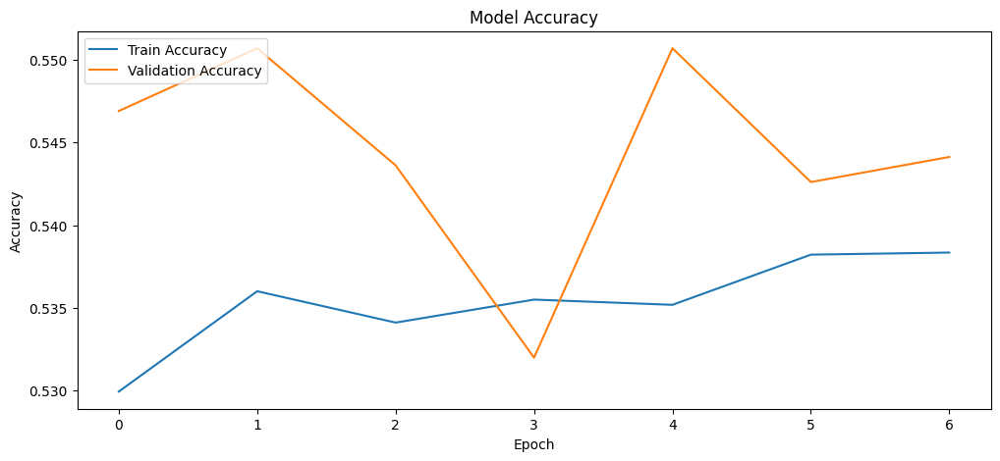

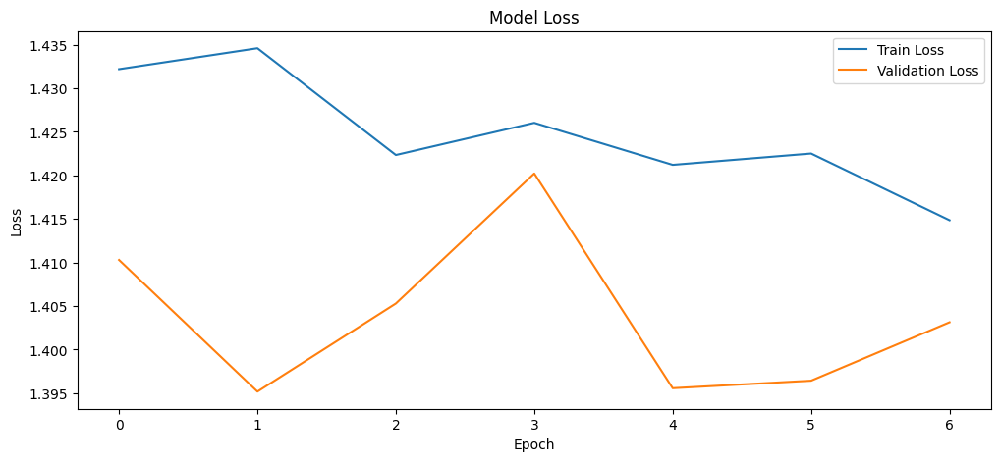

In [93]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.figure(figsize=(12, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

# Plot loss
plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.show()


## Recurrent Neural Network (RNN)

In [100]:
# Assuming X_train, X_test are FWOD feature matrices
X_train_rnn = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test_rnn = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# One-hot encode the labels for classification
from tensorflow.keras.utils import to_categorical
y_train_rnn = to_categorical(y_train, num_classes=len(np.unique(y_train)))
y_test_rnn = to_categorical(y_test, num_classes=len(np.unique(y_test)))

print("Input shape for RNN:", X_train_rnn.shape)
print("Output shape (one-hot):", y_train_rnn.shape)


Input shape for RNN: (14819, 64, 1)
Output shape (one-hot): (14819, 18)


In [107]:
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout, BatchNormalization

# # Initialize the RNN model
# rnn_model = Sequential([
#     # Recurrent layer 1
#     LSTM(128, activation='tanh', return_sequences=True, input_shape=(X_train_rnn.shape[1], X_train_rnn.shape[2])),
#     Dropout(0.3),
    
#     # Recurrent layer 2
#     LSTM(64, activation='tanh', return_sequences=False),
#     Dropout(0.3),
    
#     # Fully connected layers
#     Dense(64, activation='relu'),
#     Dropout(0.3),
#     Dense(len(np.unique(y_train)), activation='softmax')  # Multi-class classification
# ])

# # Compile the model
# rnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Model summary
# rnn_model.summary()

from tensorflow.keras.layers import Bidirectional

rnn_model = Sequential([
    # Bidirectional LSTM layer
    Bidirectional(LSTM(128, activation='tanh', return_sequences=True), input_shape=(X_train_rnn.shape[1], X_train_rnn.shape[2])),
    Dropout(0.3),
    
    # Recurrent layer 2
    LSTM(64, activation='tanh', return_sequences=False),
    Dropout(0.3),
    
    # Fully connected layers
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(len(np.unique(y_train)), activation='softmax')
])

# Compile the model
rnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
rnn_model.summary()


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_6 (Bidirectional) │ (None, 64, 256)        │       133,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 64, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_23 (LSTM)                  │ (None, 64)             │        82,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 18)             │         1,170 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 220,626 (861.82 KB)

 Trainable params: 220,626 (861.82 KB)

 Non-trainable params: 0 (0.00 B)

In [108]:
from tensorflow.keras.callbacks import EarlyStopping

# Add early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = rnn_model.fit(
    X_train_rnn,
    y_train_rnn,
    validation_data=(X_test_rnn, y_test_rnn),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)


Epoch 1/50
464/464 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - accuracy: 0.2593 - loss: 2.3497 - val_accuracy: 0.2993 - val_loss: 2.2059
Epoch 2/50
464/464 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - accuracy: 0.3014 - loss: 2.2211 - val_accuracy: 0.3233 - val_loss: 2.1293
Epoch 3/50
464/464 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - accuracy: 0.3195 - loss: 2.1348 - val_accuracy: 0.3490 - val_loss: 2.0701
Epoch 4/50
464/464 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - accuracy: 0.3394 - loss: 2.1032 - val_accuracy: 0.3617 - val_loss: 2.0364
Epoch 5/50
464/464 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - accuracy: 0.3472 - loss: 2.0586 - val_accuracy: 0.3606 - val_loss: 2.0295
Epoch 6/50
464/464 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.3505 - loss: 2.0377 - val_accuracy: 0.3557 - val_loss: 2.0122
Epoch 7/50
464/464 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - accuracy: 0.3590 - loss: 2.0059 - val_accuracy: 0.3668 - val_loss: 1.9590
Epoch 8/50
464/464 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - accuracy: 0.3637 - loss: 1.9895 -

In [109]:
# Evaluate on the test set
test_loss, test_accuracy = rnn_model.evaluate(X_test_rnn, y_test_rnn, verbose=0)
print(f"RNN Test Accuracy: {test_accuracy}")

# Predictions and classification report
y_pred_rnn = np.argmax(rnn_model.predict(X_test_rnn), axis=1)
y_test_decoded = np.argmax(y_test_rnn, axis=1)

from sklearn.metrics import classification_report, confusion_matrix

print("\nClassification Report:")
print(classification_report(y_test_decoded, y_pred_rnn))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test_decoded, y_pred_rnn))


RNN Test Accuracy: 0.7649123072624207
116/116 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.83      0.75       189
           1       0.83      0.78      0.80       151
           2       0.88      0.88      0.88        16
           3       0.60      0.26      0.36        23
           4       0.68      0.75      0.71       106
           5       0.77      0.80      0.79       438
           6       0.75      0.46      0.57        13
           7       0.67      0.30      0.41        27
           8       0.70      0.72      0.71       144
           9       0.82      0.70      0.76       419
          10       0.82      0.88      0.85       685
          11       0.74      0.87      0.80        23
          12       0.58      0.75      0.66       138
          13       0.37      0.52      0.43        44
          14       0.76      0.49      0.60        51
          15       0.69      0.

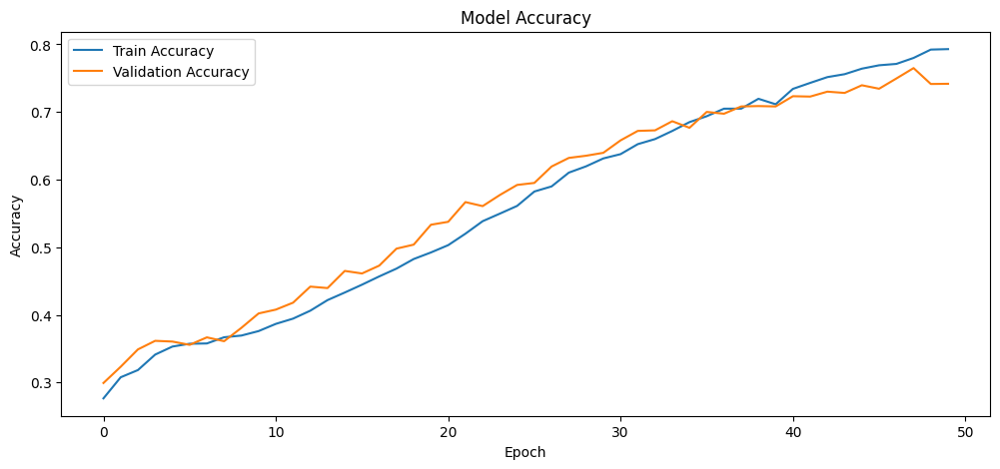

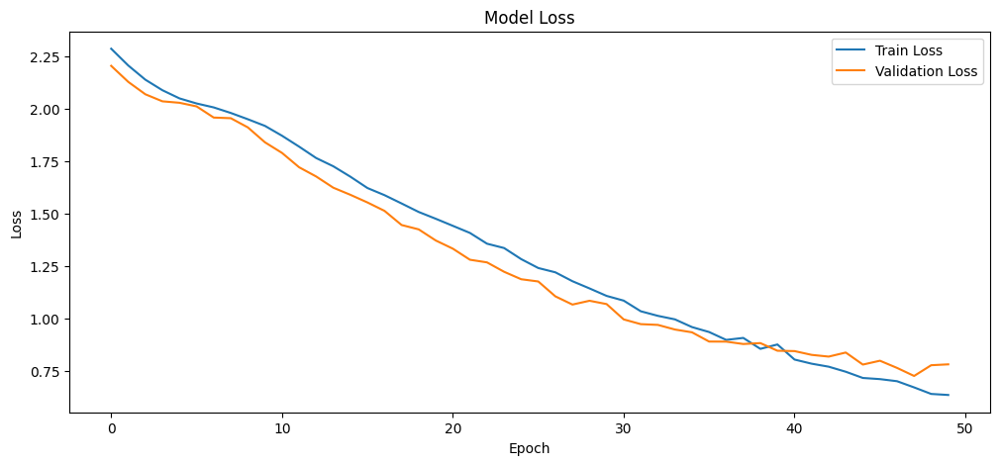

In [110]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.figure(figsize=(12, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

# Plot loss
plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.show()
